# **Synovium Hyperparameter search**

In this notebook I run the hyperparameter search for the downstream analysis of treatment differences in the synovium.
We use untreated single cell data from [1] and paired bulk untreated and treated (16weeks) from [2] to infer the cell-type specific treatment effect.

1. Zhang, F. et al. Deconstruction of rheumatoid arthritis synovium defines inflammatory subtypes. Nature 623, 616–624 (2023).
DOI:10.1038/s41586-023-06708-y

2. Rivellese, F. et al. Rituximab versus tocilizumab in rheumatoid arthritis: synovial biopsy-based biomarker analysis of the phase 4 R4RA randomized trial. Nat. Med. 28, 1256–1268 (2022).


# **Imports**

In [1]:
# import the VAE code
import sys
from buddi import buddi
from buddi.preprocessing import sc_preprocess
from buddi.plotting import validation_plotting as vp


# general imports

import warnings
import numpy as np
import scanpy as sc
import scipy


# Images, plots, display, and visualization
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import scale, MinMaxScaler
from matplotlib_venn import venn2
from upsetplot import from_contents, UpSet

# programming stuff
import time
import os
import pickle
from pathlib import Path

# tensorflow stuff
import tensorflow as tf
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.utils import to_categorical, normalize, plot_model


# disable eager execution
# https://github.com/tensorflow/tensorflow/issues/47311#issuecomment-786116401
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/davidnat/

In [2]:
## parameters
sc_aug_data_path = f"{os.getcwd()}/../data/single_cell_data/augmented_synovium_data/"
bulk_aug_data_path = f"{os.getcwd()}/../data/bulk_data/synovium/"
res_data_path = f"{os.getcwd()}/../results/single_cell_data/buddiM2_synovium/"
clinical_file = f"{os.getcwd()}/../data/single_cell_data/synovium/metadata_clin_donor_singlecell.csv"


cibersort_path = f"{os.getcwd()}/../data/single_cell_data/cibersort_synovium/"



cibersort_genes_path = (f"{os.getcwd()}/../results/single_cell_data/cibersort_synovium/" +
                        "CIBERSORTx_Job42_test_cybersort_sig_inferred_phenoclasses" +
                        ".CIBERSORTx_Job42_test_cybersort_sig_inferred_refsample.bm.K999.txt")

num_genes = 7000

exp_id = "all-synovium"
res_id = "rittoc-synovium"
curr_treatment = "Rituximab_Tocilizumab"

RETRAIN_MODELS = False
RUN_CIBERSORT_GENES = False
RUN_CIBERSORT_SAMPLES = False


# Set-up experimental variables

In [3]:

##################################################
#####. set up experiment specific variables
##################################################

# number expected cell types
n_cell_types = 8

# number of patients/domains/samples expected
n_tot_samples = 23 # 16 bulk and 7 single cell samples -- Tocilizumab
n_tot_samples = 22 # 16 bulk and 6 single cell samples -- Tocilizumab
n_tot_samples = 27 # 16 bulk and 11 single cell samples -- Tocilizumab
n_tot_samples = 24 # 16 bulk and 8 single cell samples -- Tocilizumab
n_tot_samples = 147 # 139 bulk and 8 single cell samples -- Tocilizumab

# number of drugs (CTRL, Tocilizumab, Rituximab)
# one-hot encoded
n_drugs = 3

# number of types of sequencing (one-hot encoded)
n_tech = 2


# **Load / Pre-process data**
Import pre-processed pseudobulks

In [4]:
# get the info for CIBERSORT for generating the union_genes

if RUN_CIBERSORT_GENES:
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, "BRI-415", "CTRL", "Train", exp_id)
    pseudobulks_df.columns = gene_df

    # now we transpose
    pseudobulks_sparse = scipy.sparse.csr_matrix(pseudobulks_df.values)
    pseudobulks_sparse_t = pseudobulks_sparse.transpose()
    pseudobulks_df = pd.DataFrame.sparse.from_spmatrix(pseudobulks_sparse_t)
    pseudobulks_df.columns = range(pseudobulks_df.shape[1])

    # now write it out
    sc_preprocess.write_cs_bp_files(cibersort_path, exp_id, sig_df, pseudobulks_df)
    sig_samp_df = sig_df

    sig_df_vals = sig_samp_df.iloc[:,1:]
    sig_df_celltype = sig_samp_df.scpred_CellType

    # now we transpose
    sig_sparse = scipy.sparse.csr_matrix(sig_df_vals.values)
    sig_sparse_t = sig_sparse.transpose()
    sig_sparse = pd.DataFrame.sparse.from_spmatrix(sig_sparse_t)
    sig_sparse.columns = sig_df_celltype
    sig_sparse.index = sig_samp_df.columns[1:]

    sig_sparse = pd.DataFrame(sig_sparse)

    sig_out_file = os.path.join(cibersort_path, f"test_cybersort_sig.tsv.gz")
    sig_out_path = Path(sig_out_file)
    sig_sparse = sig_sparse.astype('int')
    sig_sparse.to_csv(sig_out_path, sep='\t',header=True)

    # write out the bulk RNA-seq mixture matrix
    sig_out_file = os.path.join(cibersort_path, f"test_cybersort_mix.tsv.gz")
    sig_out_path = Path(sig_out_file)

    pseudobulks_df.to_csv(sig_out_path, sep='\t',header=True)


In [5]:
in_name = f"synovium_bulk_processed_{curr_treatment}"


# read in the real bulk data
processed_sc_file = f"{bulk_aug_data_path}/{in_name}.h5ad"
adata = sc.read_h5ad(processed_sc_file)


# now get the sc ref training data

# read in order
# oritinal samples
sample_order = ['BRI-462', 'BRI-458', 'BRI-460', 'BRI-421',
                'BRI-515', 'BRI-415', 'BRI-436']

#nonimmune samples
sample_order = ['BRI-460', 'BRI-462', 'BRI-515', 'BRI-601', 'BRI-605']
#immune samples
sample_order = ['BRI-415', 'BRI-421', 'BRI-436', 'BRI-458', 'BRI-566', 'BRI-623']

# all samples
sample_order = ['BRI-415', 'BRI-421', 'BRI-436', 'BRI-458', 'BRI-566', 'BRI-623',
                'BRI-460', 'BRI-462', 'BRI-515', 'BRI-601', 'BRI-605']

# new filter level
sample_order = ['BRI-421', 'BRI-436', 'BRI-458', 'BRI-460',
                'BRI-462', 'BRI-475', 'BRI-515', 'BRI-542']

X_concat = None
Y_concat = None
meta_concat = None
for curr_samp in sample_order:

    print(curr_samp)
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, curr_samp, "CTRL", "Train", exp_id)
    pseudobulks_df.columns = gene_df

    if X_concat is None:
        X_concat, Y_concat, meta_concat = pseudobulks_df, prop_df, metadata_df
    else:
        X_concat = pd.concat([X_concat, pseudobulks_df])
        Y_concat = pd.concat([Y_concat, prop_df])
        meta_concat = pd.concat([meta_concat, metadata_df])

# remove cell type specific
#non_ct_spec = np.where(meta_concat.cell_prop_type != "cell_type_specific")[0]
#X_concat = X_concat.iloc[non_ct_spec]
#Y_concat = Y_concat.iloc[non_ct_spec]
#meta_concat = meta_concat.iloc[non_ct_spec]


# format the bulk data
real_bulk_df = pd.DataFrame(adata.X.todense(), columns=adata.var_names, index=adata.obs.index)
real_bulk_meta_df = adata.obs

# select genes that are in both
intersect_genes = np.intersect1d(gene_df, real_bulk_df.columns)
X_concat = X_concat[intersect_genes]
real_bulk_df = real_bulk_df[intersect_genes]

# now we have a new gene_df
gene_df = pd.DataFrame(intersect_genes)
gene_df.columns = ["gene_ids"]
gene_df.set_index(gene_df["gene_ids"])
gene_df = gene_df.gene_ids

# get the bulk metadata formatted

# first encode for three possible treatments
temp_real_bulk_meta_df = real_bulk_meta_df
temp_real_bulk_meta_df["drug_stim"] = "CTRL"
temp_real_bulk_meta_df.drug_stim.iloc[np.where(np.logical_and(real_bulk_meta_df.stim == "STIM", 
                                                              real_bulk_meta_df.treatment == "Tocilizumab"))[0]] = "toc"
temp_real_bulk_meta_df.drug_stim.iloc[np.where(np.logical_and(real_bulk_meta_df.stim == "STIM", 
                                                              real_bulk_meta_df.treatment == "Rituximab"))[0]] = "rit"
real_bulk_meta_df["stim"] = temp_real_bulk_meta_df["drug_stim"]

# then add in other columns needed
real_bulk_meta_df = real_bulk_meta_df[["sample_id", "stim"]]
real_bulk_meta_df["isTraining"] = "Train"
real_bulk_meta_df["cell_prop_type"] = "realistic"
real_bulk_meta_df["samp_type"] = "bulk"
real_bulk_meta_df['sample_id'] = real_bulk_meta_df['sample_id'].astype(str)

# put the reference singlecell and real bulk it all together
X_full = pd.concat([X_concat, real_bulk_df])
Y_full = pd.concat([Y_concat, Y_concat.iloc[range(real_bulk_df.shape[0])]]) ## stop gap for now
meta_df = pd.concat([meta_concat, real_bulk_meta_df])

# add clinical info
clinical_df = pd.read_csv(clinical_file)
clinical_df = meta_df.merge(clinical_df, left_on="sample_id", right_on="mRNA_run", how='left')
meta_df = clinical_df

# update technologies
#sc_tech_idx = np.where(meta_df.samp_type == "sc_ref")[0]
#meta_df.samp_type.iloc[sc_tech_idx] = meta_df.single_cell_tech.iloc[sc_tech_idx]

# index for checking correlations
sc_idx = np.where(meta_df.samp_type != "bulk")[0]
bulk_idx = np.where(meta_df.samp_type == "bulk")[0]


BRI-421
BRI-436
BRI-458
BRI-460
BRI-462
BRI-475
BRI-515
BRI-542


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_82540/4146201272.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_real_bulk_meta_df.drug_stim.iloc[np.where(np.logical_and(real_bulk_meta_df.stim == "STIM",
/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_82540/4146201272.py:74: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_real_bulk_meta_df.drug_stim.iloc[np.where(np.logical_and(real_bulk_meta_df.stim == "STIM",
/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_82540/4146201272.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
T

In [6]:
X_concat

gene_ids,A1BG,A1BG-AS1,A2M,A2M-AS1,A4GALT,AAAS,AACS,AADAT,AAGAB,AAK1,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1
0,20.0,5.0,3170.0,3.0,173.0,29.0,17.0,1.0,42.0,171.0,...,28.0,12.0,4.0,11.0,9.0,27.0,0.0,62.0,172.0,46.0
0,21.0,2.0,2977.0,3.0,160.0,23.0,12.0,0.0,17.0,119.0,...,24.0,21.0,11.0,6.0,6.0,34.0,0.0,74.0,96.0,37.0
0,32.0,4.0,3720.0,3.0,197.0,27.0,12.0,0.0,34.0,145.0,...,25.0,14.0,7.0,11.0,7.0,36.0,0.0,59.0,210.0,61.0
0,47.0,5.0,3863.0,5.0,178.0,18.0,13.0,0.0,36.0,165.0,...,23.0,13.0,9.0,7.0,10.0,47.0,0.0,87.0,132.0,76.0
0,24.0,6.0,3936.0,3.0,207.0,37.0,9.0,0.0,44.0,156.0,...,24.0,18.0,8.0,10.0,9.0,31.0,0.0,70.0,134.0,48.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,76.0,6.0,506.0,3.0,4.0,30.0,23.0,0.0,31.0,152.0,...,11.0,16.0,9.0,1.0,2.0,42.0,0.0,82.0,297.0,63.0
0,74.0,10.0,503.0,3.0,2.0,44.0,19.0,1.0,28.0,186.0,...,13.0,13.0,9.0,3.0,2.0,37.0,0.0,70.0,345.0,108.0
0,81.0,13.0,495.0,6.0,0.0,35.0,25.0,0.0,41.0,159.0,...,5.0,18.0,4.0,3.0,2.0,37.0,0.0,59.0,316.0,74.0
0,93.0,13.0,430.0,1.0,1.0,23.0,19.0,0.0,29.0,145.0,...,10.0,10.0,2.0,3.0,4.0,37.0,0.0,61.0,304.0,74.0


In [7]:
# get the info for CIBERSORT for generating the mixture

if RUN_CIBERSORT_SAMPLES: 
    _, _, _, sig_df, _ = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, "BRI-462", "CTRL", "Train", exp_id)

    # now we format the real bulks
    cibersort_bulk = real_bulk_df
    cibersort_bulk = cibersort_bulk.transpose()
    cibersort_bulk

    sig_out_file = os.path.join(bulk_aug_data_path, f"bulk_cibersort_{curr_treatment}.tsv")
    sig_out_path = Path(sig_out_file)

    cibersort_bulk.to_csv(sig_out_path, sep='\t',header=True)



In [8]:
# double check all the pseudobulks/bulks were read in
meta_df.sample_id.value_counts()

BRI-421         1800
BRI-458         1800
BRI-460         1800
BRI-462         1800
BRI-475         1800
                ... 
R4RAPAT00003       1
R4RAPAT00021       1
R4RAPAT00157       1
R4RAPAT00108       1
R4RAPAT00156       1
Name: sample_id, Length: 147, dtype: int64

In [9]:
meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type,subject_id,pipeline_date,site,treatment,biopsied,...,disease_duration,tissue_type,krenn_lining,krenn_inflammation,single_cell_tech,cell_count_to_10x,mRNA_run,protein_run,atac_run,qc
0,BRI-421,CTRL,Train,random,sc_ref,300-0501,8/12/19,UK Birmingham,1,Knee,...,0.0,Biopsy,1.33,2.33,CITEseq,"12,400",BRI-421,BRI-422,NaN,Pass
1,BRI-421,CTRL,Train,random,sc_ref,300-0501,8/12/19,UK Birmingham,1,Knee,...,0.0,Biopsy,1.33,2.33,CITEseq,"12,400",BRI-421,BRI-422,NaN,Pass
2,BRI-421,CTRL,Train,random,sc_ref,300-0501,8/12/19,UK Birmingham,1,Knee,...,0.0,Biopsy,1.33,2.33,CITEseq,"12,400",BRI-421,BRI-422,NaN,Pass
3,BRI-421,CTRL,Train,random,sc_ref,300-0501,8/12/19,UK Birmingham,1,Knee,...,0.0,Biopsy,1.33,2.33,CITEseq,"12,400",BRI-421,BRI-422,NaN,Pass
4,BRI-421,CTRL,Train,random,sc_ref,300-0501,8/12/19,UK Birmingham,1,Knee,...,0.0,Biopsy,1.33,2.33,CITEseq,"12,400",BRI-421,BRI-422,NaN,Pass
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14579,R4RAPAT00091,rit,Train,realistic,bulk,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14580,R4RAPAT00092,CTRL,Train,realistic,bulk,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14581,R4RAPAT00093,CTRL,Train,realistic,bulk,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14582,R4RAPAT00093,rit,Train,realistic,bulk,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
Y_full

,NK,B,Endothelial,Fibroblast,Myeloid,T_CD8,T_CD4,T_other
0,0.070,0.055,0.025,0.425,0.140,0.180,0.015,0.090
0,0.530,0.070,0.145,0.005,0.010,0.005,0.230,0.005
0,0.005,0.100,0.005,0.005,0.005,0.305,0.005,0.570
0,0.035,0.615,0.185,0.005,0.145,0.005,0.005,0.005
0,0.175,0.005,0.295,0.145,0.200,0.150,0.025,0.005
...,...,...,...,...,...,...,...,...
0,0.005,0.005,0.015,0.005,0.005,0.035,0.005,0.925
0,0.550,0.240,0.125,0.060,0.010,0.005,0.005,0.005
0,0.220,0.020,0.005,0.010,0.645,0.090,0.005,0.005
0,0.030,0.030,0.435,0.115,0.110,0.020,0.140,0.120


In [11]:
X_full

,A1BG,A1BG-AS1,A2M,A2M-AS1,A4GALT,AAAS,AACS,AADAT,AAGAB,AAK1,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11B,ZYX,ZZEF1
0,20.0,5.0,3170.0,3.0,173.0,29.0,17.0,1.0,42.0,171.0,...,28.0,12.0,4.0,11.0,9.0,27.0,0.0,62.0,172.0,46.0
0,21.0,2.0,2977.0,3.0,160.0,23.0,12.0,0.0,17.0,119.0,...,24.0,21.0,11.0,6.0,6.0,34.0,0.0,74.0,96.0,37.0
0,32.0,4.0,3720.0,3.0,197.0,27.0,12.0,0.0,34.0,145.0,...,25.0,14.0,7.0,11.0,7.0,36.0,0.0,59.0,210.0,61.0
0,47.0,5.0,3863.0,5.0,178.0,18.0,13.0,0.0,36.0,165.0,...,23.0,13.0,9.0,7.0,10.0,47.0,0.0,87.0,132.0,76.0
0,24.0,6.0,3936.0,3.0,207.0,37.0,9.0,0.0,44.0,156.0,...,24.0,18.0,8.0,10.0,9.0,31.0,0.0,70.0,134.0,48.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R4RAPAT00091-week16,351.0,69.0,26633.0,137.0,2484.0,1825.0,1217.0,171.0,1110.0,1979.0,...,499.0,301.0,167.0,281.0,441.0,1442.0,58.0,1611.0,4591.0,3473.0
R4RAPAT00092-week0,299.0,50.0,29690.0,28.0,1117.0,1672.0,1499.0,75.0,1442.0,2538.0,...,691.0,389.0,330.0,158.0,383.0,1363.0,55.0,1681.0,7602.0,3907.0
R4RAPAT00093-week0,313.0,45.0,29257.0,103.0,1152.0,1767.0,793.0,77.0,851.0,1477.0,...,510.0,273.0,427.0,171.0,342.0,1058.0,13.0,904.0,11214.0,2772.0
R4RAPAT00093-week16,376.0,50.0,5920.0,62.0,1958.0,1204.0,985.0,32.0,558.0,1074.0,...,330.0,255.0,307.0,83.0,140.0,770.0,81.0,705.0,4712.0,1954.0


In [12]:
# check correlation between bulk and single cell
# we want them to be similar between bulk+sc and within bulk
sc_check = sc_idx[0]
bulk_check = bulk_idx[0]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))

bulk_check = bulk_idx[1]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[2]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[5]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[12]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))

[[1.         0.32791933]
 [0.32791933 1.        ]]
[[1.         0.42057681]
 [0.42057681 1.        ]]
[[1.         0.33839396]
 [0.33839396 1.        ]]
[[1.         0.39871069]
 [0.39871069 1.        ]]
[[1.         0.46977371]
 [0.46977371 1.        ]]


In [13]:
# check correlation within bulk
bulk_check0 = bulk_idx[0]
bulk_check1 = bulk_idx[1]

print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))

bulk_check1 = bulk_idx[1]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[2]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[5]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[12]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))

[[1.         0.31960137]
 [0.31960137 1.        ]]
[[1.         0.31960137]
 [0.31960137 1.        ]]
[[1.         0.36888141]
 [0.36888141 1.        ]]
[[1.         0.41612075]
 [0.41612075 1.        ]]
[[1.         0.56025044]
 [0.56025044 1.        ]]


In [14]:
# check correlation within sc
sc_check0 = sc_idx[0]
sc_check1 = sc_idx[5000]

print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))

sc_check1 = sc_idx[1]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[2]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[5]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[12]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))

[[1.         0.77513972]
 [0.77513972 1.        ]]
[[1.         0.99560234]
 [0.99560234 1.        ]]
[[1.         0.99792558]
 [0.99792558 1.        ]]
[[1.         0.99860135]
 [0.99860135 1.        ]]
[[1.        0.9975377]
 [0.9975377 1.       ]]


# Define indices and set-up metadata

In [15]:

##################################################
#####. Design the experiment
##################################################


X_orig = np.copy(X_full)

# set up the metadata arrays and indices
samp_label = np.asarray(meta_df.sample_id)
index_label, numeric_label = np.unique(samp_label, return_inverse=True)
Label_full = numeric_label
label_full = to_categorical(numeric_label)

samp_drug = np.asarray(meta_df.stim)
index_drug, numeric_drug = np.unique(samp_drug, return_inverse=True)
Drug_full = numeric_drug
drug_full = to_categorical(numeric_drug)

samp_bulk = np.asarray(meta_df.samp_type)
index_bulk, numeric_bulk = np.unique(samp_bulk, return_inverse=True)
Bulk_full = numeric_bulk
bulk_full = to_categorical(numeric_bulk)


idx_train = np.where(meta_df.isTraining=="Train")[0] 
idx_test = np.where(meta_df.isTraining!="Train")[0] 
idx_bulk = np.where(meta_df.samp_type == "bulk")[0]
idx_sc = np.where(meta_df.samp_type != "bulk")[0]
idx_drug = np.where(meta_df.stim != "CTRL")[0]
idx_random = np.where(meta_df.cell_prop_type == "random")[0]

Y_max = np.copy(Y_full)
Y_max = np.argmax(Y_max, axis=1)
Y_max = Y_full.columns[Y_max]
meta_df["Y_max"] = Y_max

# now seperate out the training and testing data
X_train_df = X_full.iloc[idx_train]
Y_train_df = Y_full.iloc[idx_train]


# try using the cibersort genes
cibersort_df = pd.read_csv(cibersort_genes_path, sep="\t" )
cibersort_genes = cibersort_df["NAME"].values.tolist()

# only keep cibersort genes that are in common genes
cibersort_genes = np.intersect1d(gene_df, cibersort_genes)

# add in IL6
cibersort_genes = np.union1d(["IL6"], cibersort_genes)


# convert to data matrices
X_train = X_train_df.to_numpy()
Y_train = Y_train_df.to_numpy()

## get the top variable genes
X_colmean = X_train.mean(axis=0)
X_colvar = X_train.var(axis=0)
X_CoV = np.array(np.divide(X_colvar, X_colmean+0.001))

# need to get the genes such that
# the union of the highly variable and the
# CIBERSORTx genes are 7000 total
num_genes_found = False
initial_count = 7000
while not num_genes_found:
    idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:]
    top_gene_df = gene_df.iloc[idx_top]
    CoV_only = np.union1d(top_gene_df, cibersort_genes)
    if len(CoV_only) == 7000:
        num_genes_found = True
    else:
        initial_count = initial_count -1

idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:] # num_genes to get 1550
gene_df = gene_df.iloc[idx_top]


In [16]:
X_CoV.shape

(16331,)

# Make sure our test/train indicies are correct

Show some stats on the samples

In [17]:
np.unique(Bulk_full,  return_counts=True)

(array([0, 1]), array([  184, 14400]))

In [18]:
tab = meta_df.groupby(['samp_type', 'sample_id']).size()
tab.unstack()

sample_id,BRI-421,BRI-436,BRI-458,BRI-460,BRI-462,BRI-475,BRI-515,BRI-542,R4RAPAT00002,R4RAPAT00003,...,R4RAPAT00146,R4RAPAT00148,R4RAPAT00149,R4RAPAT00150,R4RAPAT00151,R4RAPAT00152,R4RAPAT00154,R4RAPAT00155,R4RAPAT00156,R4RAPAT00157
samp_type,,,,,,,,,,,,,,,,,,,,,
bulk,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
sc_ref,1800.0,1800.0,1800.0,1800.0,1800.0,1800.0,1800.0,1800.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [19]:
tab = meta_df.groupby(['isTraining', 'samp_type']).size()
tab.unstack()

samp_type,bulk,sc_ref
isTraining,,
Train,184,14400


In [20]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'stim']).size()
tab.unstack()

stim,CTRL,rit,toc
isTraining,,,
Train,14533,33,18


In [21]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'samp_type']).size()
tab.unstack()

samp_type,bulk,sc_ref
isTraining,,
Train,184,14400


# compare our variable genes with cibersort defined genes

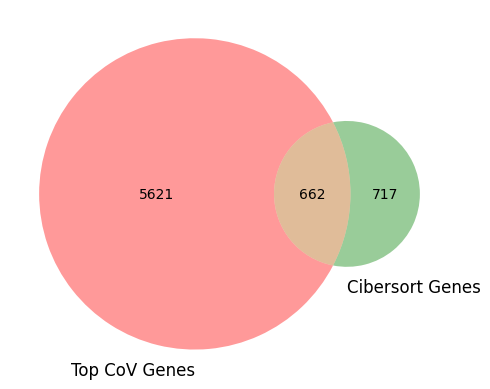

In [22]:

venn2([set(gene_df), set(cibersort_genes)], set_labels = ('Top CoV Genes', 'Cibersort Genes'))
plt.show()

In [23]:
union_genes = np.union1d(gene_df, cibersort_genes)
#union_genes = gene_df
len(union_genes)

7000

In [24]:
np.isin("IL6", union_genes)

array(True)

In [25]:
X_full = X_full.loc[:,union_genes]


In [26]:
# check quantile estimates

print(np.quantile(X_full, 0.9))
print(np.quantile(X_full.iloc[sc_idx], 0.9))
print(np.quantile(X_full.iloc[bulk_idx], 0.9))


467.0
425.0
4919.0


In [27]:
# check correlation between bulk and single cell
sc_check = sc_idx[0]
bulk_check = bulk_idx[0]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))

bulk_check = bulk_idx[1]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[2]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[5]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))


bulk_check = bulk_idx[12]
print(np.corrcoef((X_full.iloc[sc_check] / np.sum(X_full.iloc[sc_check])), (X_full.iloc[bulk_check] / np.sum(X_full.iloc[bulk_check]))))

[[1.         0.32187442]
 [0.32187442 1.        ]]
[[1.         0.41231079]
 [0.41231079 1.        ]]
[[1.         0.32731206]
 [0.32731206 1.        ]]
[[1.         0.38806777]
 [0.38806777 1.        ]]
[[1.         0.46319389]
 [0.46319389 1.        ]]


In [28]:
# check correlation within bulk
bulk_check0 = bulk_idx[0]
bulk_check1 = bulk_idx[1]

print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))

bulk_check1 = bulk_idx[1]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[2]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[5]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))


bulk_check1 = bulk_idx[12]
print(np.corrcoef((X_full.iloc[bulk_check0] / np.sum(X_full.iloc[bulk_check0])), (X_full.iloc[bulk_check1] / np.sum(X_full.iloc[bulk_check1]))))

[[1.         0.31147853]
 [0.31147853 1.        ]]
[[1.         0.31147853]
 [0.31147853 1.        ]]
[[1.         0.36033803]
 [0.36033803 1.        ]]
[[1.         0.40820134]
 [0.40820134 1.        ]]
[[1.         0.55583375]
 [0.55583375 1.        ]]


In [29]:
# check correlation within sc
sc_check0 = sc_idx[0]
sc_check1 = sc_idx[5000]

print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))

sc_check1 = sc_idx[1]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[2]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[5]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))


sc_check1 = sc_idx[12]
print(np.corrcoef((X_full.iloc[sc_check0] / np.sum(X_full.iloc[sc_check0])), (X_full.iloc[sc_check1] / np.sum(X_full.iloc[sc_check1]))))

[[1.         0.77336408]
 [0.77336408 1.        ]]
[[1.         0.99558485]
 [0.99558485 1.        ]]
[[1.         0.99793682]
 [0.99793682 1.        ]]
[[1.         0.99862144]
 [0.99862144 1.        ]]
[[1.         0.99754985]
 [0.99754985 1.        ]]


# Normalize data

In [30]:
X_full = X_full.loc[:,union_genes]

# rescale sc_ref and bulks
median_sc_ref = np.median(np.quantile(X_full.iloc[sc_idx], axis=1, q=0.9))
median_bulk = np.median(np.quantile(X_full.iloc[bulk_idx], axis=1, q=0.9))

ratio_medians = median_bulk/median_sc_ref

X_full.iloc[sc_idx] = X_full.iloc[sc_idx]*ratio_medians


In [31]:
ratio_medians

11.515769044153314

In [32]:
# check quantile estimates

print(np.quantile(X_full, 0.9))
print(np.quantile(X_full.iloc[sc_idx], 0.9))
print(np.quantile(X_full.iloc[bulk_idx], 0.9))


4894.201843765159
4894.201843765159
4919.0


In [33]:

## normalize within sample
clip_upper = np.quantile(X_full, 0.9)
X_full = np.clip(X_full, 0, clip_upper)
scaler = MinMaxScaler()
scaler.fit(X_full)

# now normalize with the scaler trained on the 
# training data
X_full = np.clip(X_full, 0, clip_upper)
X_full = scaler.transform(X_full)


# for unknown proportions; 
# this is bulks used in training
idx_bulk_train = np.intersect1d(idx_bulk, idx_train) 
X_unkp = X_full[idx_bulk_train,]
label_unkp = label_full[idx_bulk_train,]
drug_unkp = drug_full[idx_bulk_train,]
bulk_unkp = bulk_full[idx_bulk_train,]
y_unkp = Y_full.iloc[idx_bulk_train]
y_unkp = y_unkp.to_numpy()

# for known proportions
idx_sc_train = np.intersect1d(idx_sc, idx_train) 
X_kp = X_full[idx_sc_train,]
label_kp = label_full[idx_sc_train,]
drug_kp = drug_full[idx_sc_train,]
bulk_kp = bulk_full[idx_sc_train,]
y_kp = Y_full.iloc[idx_sc_train]
y_kp = y_kp.to_numpy()


In [34]:
# check correlation between bulk and single cell
sc_check = sc_idx[0]
bulk_check = bulk_idx[0]
print(np.corrcoef((X_full[sc_check] / np.sum(X_full[sc_check])), (X_full[bulk_check] / np.sum(X_full[bulk_check]))))

bulk_check = bulk_idx[1]
print(np.corrcoef((X_full[sc_check] / np.sum(X_full[sc_check])), (X_full[bulk_check] / np.sum(X_full[bulk_check]))))


bulk_check = bulk_idx[2]
print(np.corrcoef((X_full[sc_check] / np.sum(X_full[sc_check])), (X_full[bulk_check] / np.sum(X_full[bulk_check]))))


bulk_check = bulk_idx[5]
print(np.corrcoef((X_full[sc_check] / np.sum(X_full[sc_check])), (X_full[bulk_check] / np.sum(X_full[bulk_check]))))


bulk_check = bulk_idx[12]
print(np.corrcoef((X_full[sc_check] / np.sum(X_full[sc_check])), (X_full[bulk_check] / np.sum(X_full[bulk_check]))))

[[1.         0.23830958]
 [0.23830958 1.        ]]
[[1.         0.39438838]
 [0.39438838 1.        ]]
[[1.         0.37221201]
 [0.37221201 1.        ]]
[[1.       0.342386]
 [0.342386 1.      ]]
[[1.         0.23856996]
 [0.23856996 1.        ]]


In [35]:
# check correlation within bulk
bulk_check0 = bulk_idx[0]
bulk_check1 = bulk_idx[1]

print(np.corrcoef((X_full[bulk_check0] / np.sum(X_full[bulk_check0])), (X_full[bulk_check1] / np.sum(X_full[bulk_check1]))))

bulk_check1 = bulk_idx[1]
print(np.corrcoef((X_full[bulk_check0] / np.sum(X_full[bulk_check0])), (X_full[bulk_check1] / np.sum(X_full[bulk_check1]))))


bulk_check1 = bulk_idx[2]
print(np.corrcoef((X_full[bulk_check0] / np.sum(X_full[bulk_check0])), (X_full[bulk_check1] / np.sum(X_full[bulk_check1]))))


bulk_check1 = bulk_idx[5]
print(np.corrcoef((X_full[bulk_check0] / np.sum(X_full[bulk_check0])), (X_full[bulk_check1] / np.sum(X_full[bulk_check1]))))


bulk_check1 = bulk_idx[12]
print(np.corrcoef((X_full[bulk_check0] / np.sum(X_full[bulk_check0])), (X_full[bulk_check1] / np.sum(X_full[bulk_check1]))))

[[1.         0.13050979]
 [0.13050979 1.        ]]
[[1.         0.13050979]
 [0.13050979 1.        ]]
[[1.         0.33264638]
 [0.33264638 1.        ]]
[[1.         0.35718021]
 [0.35718021 1.        ]]
[[1.         0.21254861]
 [0.21254861 1.        ]]


In [36]:
# check correlation within sc
sc_check0 = sc_idx[0]
sc_check1 = sc_idx[5000]

print(np.corrcoef((X_full[sc_check0] / np.sum(X_full[sc_check0])), (X_full[sc_check1] / np.sum(X_full[sc_check1]))))

sc_check1 = sc_idx[1]
print(np.corrcoef((X_full[sc_check0] / np.sum(X_full[sc_check0])), (X_full[sc_check1] / np.sum(X_full[sc_check1]))))


sc_check1 = sc_idx[2]
print(np.corrcoef((X_full[sc_check0] / np.sum(X_full[sc_check0])), (X_full[sc_check1] / np.sum(X_full[sc_check1]))))


sc_check1 = sc_idx[5]
print(np.corrcoef((X_full[sc_check0] / np.sum(X_full[sc_check0])), (X_full[sc_check1] / np.sum(X_full[sc_check1]))))


sc_check1 = sc_idx[12]
print(np.corrcoef((X_full[sc_check0] / np.sum(X_full[sc_check0])), (X_full[sc_check1] / np.sum(X_full[sc_check1]))))

[[1.         0.61336664]
 [0.61336664 1.        ]]
[[1.         0.97111481]
 [0.97111481 1.        ]]
[[1.         0.97843129]
 [0.97843129 1.        ]]
[[1.         0.98452131]
 [0.98452131 1.        ]]
[[1.         0.98268545]
 [0.98268545 1.        ]]


# Plot all data

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.014s...
[t-SNE] Computed neighbors for 10000 samples in 7.563s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 1.157631
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.745178
[t-SNE] KL divergence after 500 iterations: 1.394734
(10000, 2)
(10000, 2)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_82540/1731503276.py:24: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


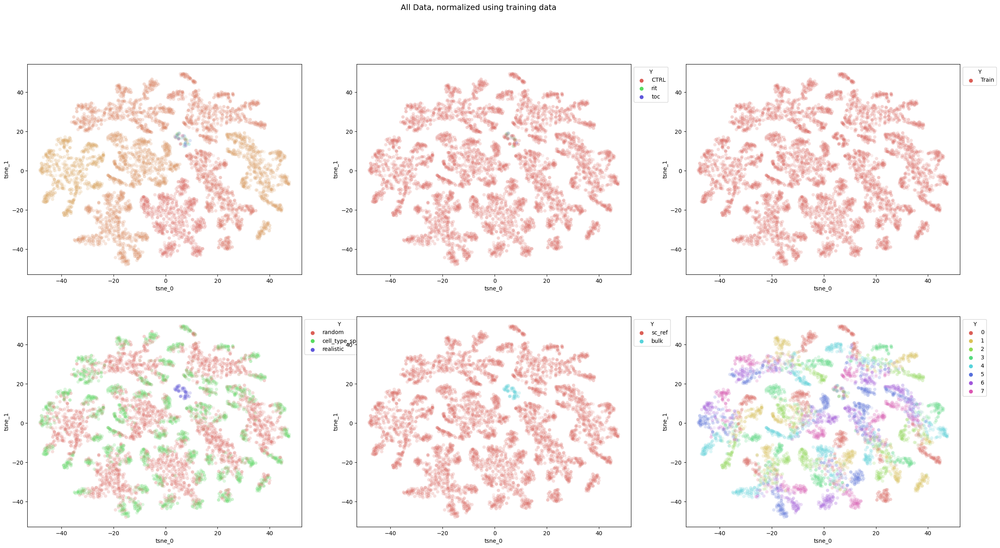

In [37]:
## plot samples
idx_tmp = np.random.choice(range(X_full.shape[0]), 10000, replace=True)


plot_df = vp.get_tsne_for_plotting(X_full[idx_tmp,])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_tmp])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].stim.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


(184, 2)
(184, 2)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_82540/119314534.py:23: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


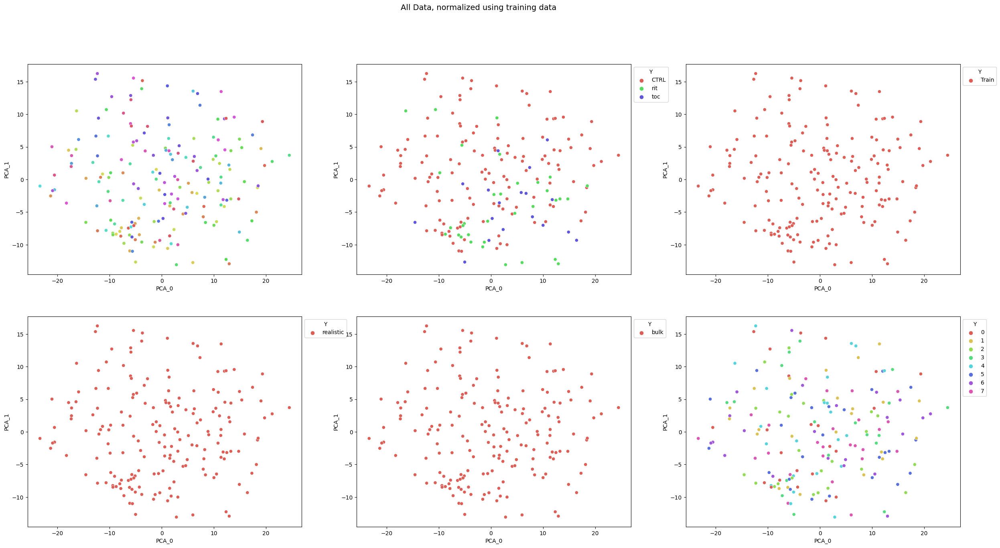

In [38]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_pca_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"", alpha=1)
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"", alpha=1)


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 184 samples in 0.000s...
[t-SNE] Computed neighbors for 184 samples in 0.014s...
[t-SNE] Computed conditional probabilities for sample 184 / 184
[t-SNE] Mean sigma: 6.089274
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.562107
[t-SNE] KL divergence after 500 iterations: 0.601591
(184, 2)
(184, 2)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_82540/614891228.py:23: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


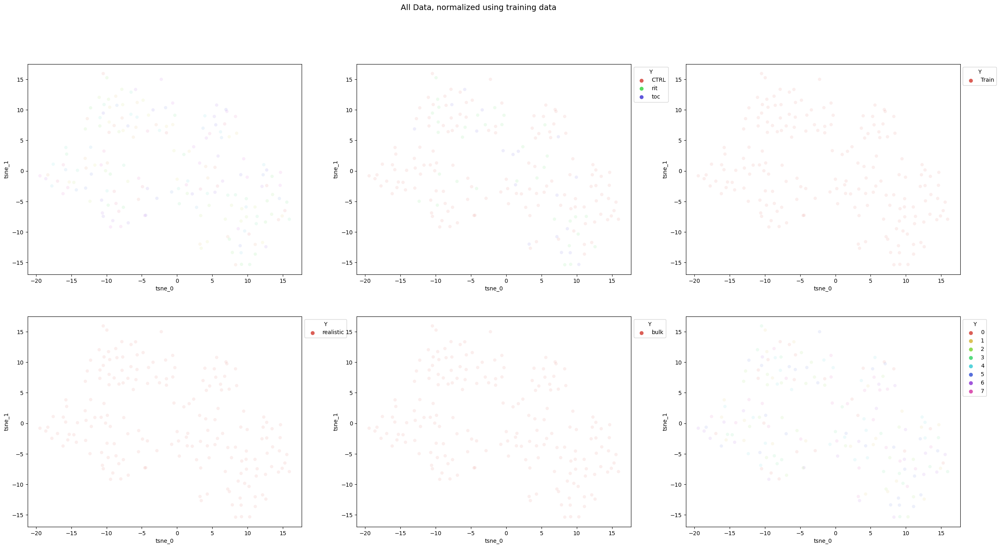

In [39]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_tsne_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


# **Run BuDDI**

## Hyperparameter Search

We are going to search over 2 parameters: 

1.  the weighting of the loss for the latent space classifications against the reconstruction (100, 1000, 10000)
2.  the number of epochs  (50, 100, 200)

2024-03-19 15:33:00.218725: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:375] MLIR V1 optimization pass is not enabled
2024-03-19 15:33:00.250368: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_h2/kernel/Assign' id:343 op device:{requested: '', assigned: ''} def:{{{node cls_h2/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](cls_h2/kernel, cls_h2/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 15:33:00.513149: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack/truediv/y' id:387 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by

test_size_samp: 500
train_size_samp: 14500


2024-03-19 15:33:01.931820: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/cls_h1/kernel/v/Assign' id:2425 op device:{requested: '', assigned: ''} def:{{{node training/Adam/cls_h1/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/cls_h1/kernel/v, training/Adam/cls_h1/kernel/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 15:33:03.076674: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_1/AddN' id:1183 op device:{requested: '', assigned: ''} def:{{{node loss_1/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_1/mul, loss_1/mul_1, loss_1/mul_2, loss_1/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger a

Elapsed:  749.1067790985107
Epoch:  49
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_classifier/assets


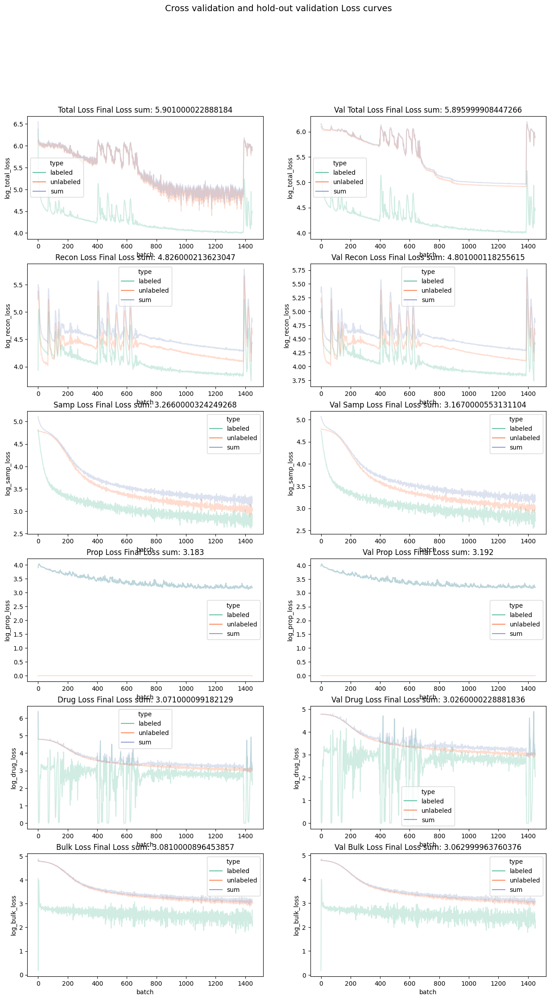

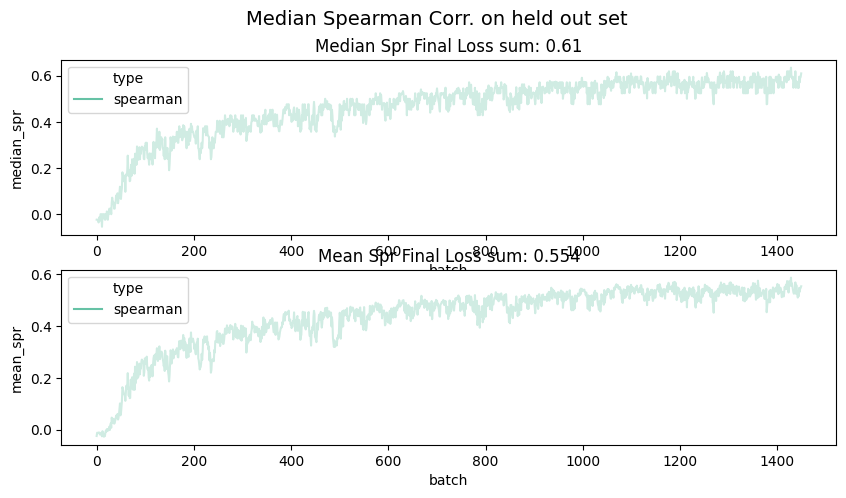

In [ ]:
curr_n_epoch=50
curr_wt = 100


params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)



### 50 1000

2024-03-19 15:45:39.546073: W tensorflow/c/c_api.cc:304] Operation '{name:'sigma_bulk_1/kernel/Assign' id:5222 op device:{requested: '', assigned: ''} def:{{{node sigma_bulk_1/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](sigma_bulk_1/kernel, sigma_bulk_1/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 15:45:39.815473: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_1/truediv/y' id:5313 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_1/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger a

test_size_samp: 500
train_size_samp: 14500


2024-03-19 15:45:41.544155: W tensorflow/c/c_api.cc:304] Operation '{name:'training_4/Adam/cls_h2_1/bias/m/Assign' id:7105 op device:{requested: '', assigned: ''} def:{{{node training_4/Adam/cls_h2_1/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_4/Adam/cls_h2_1/bias/m, training_4/Adam/cls_h2_1/bias/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 15:45:42.715785: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_3/AddN' id:6109 op device:{requested: '', assigned: ''} def:{{{node loss_3/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_3/mul, loss_3/mul_1, loss_3/mul_2, loss_3/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will t

Elapsed:  722.8230152130127
Epoch:  49
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_classifier/assets


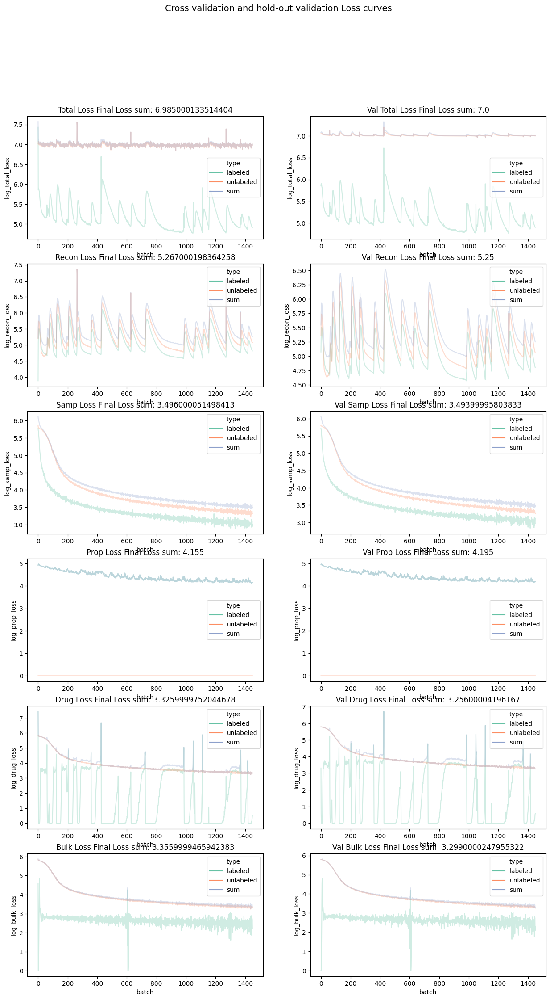

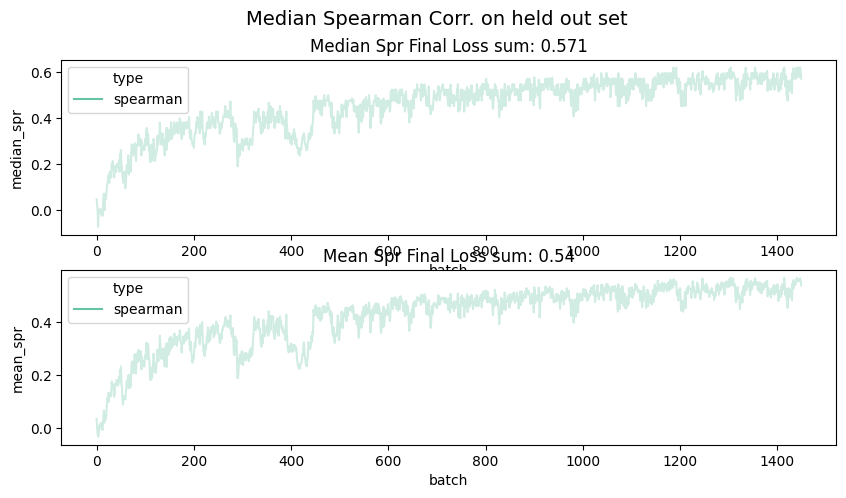

In [ ]:
curr_n_epoch=50
curr_wt = 1000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


### 50 10000

2024-03-19 15:57:53.066117: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_h1_2/kernel/Assign' id:10134 op device:{requested: '', assigned: ''} def:{{{node cls_h1_2/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](cls_h1_2/kernel, cls_h1_2/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 15:57:53.397068: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_2/truediv/y' id:10202 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_2/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the

test_size_samp: 500
train_size_samp: 14500


2024-03-19 15:57:55.635934: W tensorflow/c/c_api.cc:304] Operation '{name:'training_8/Adam/decoder_h1_6/bias/v/Assign' id:12220 op device:{requested: '', assigned: ''} def:{{{node training_8/Adam/decoder_h1_6/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_8/Adam/decoder_h1_6/bias/v, training_8/Adam/decoder_h1_6/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 15:57:57.190486: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_5/AddN' id:10998 op device:{requested: '', assigned: ''} def:{{{node loss_5/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_5/mul, loss_5/mul_1, loss_5/mul_2, loss_5/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no 

Elapsed:  722.3180868625641
Epoch:  49
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_classifier/assets


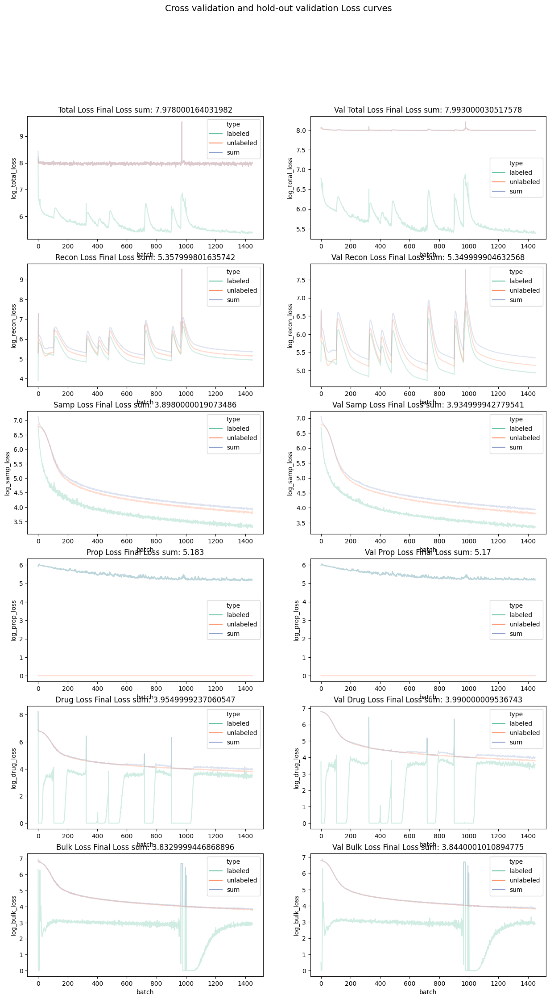

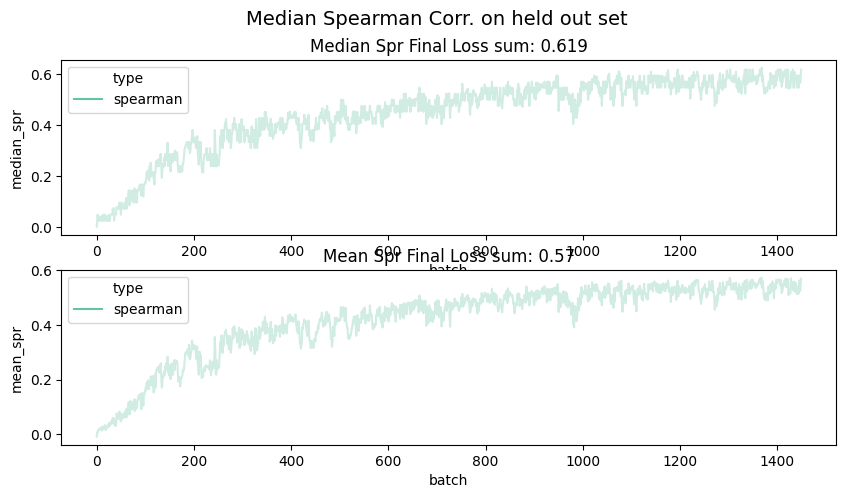

In [ ]:
curr_n_epoch=50
curr_wt = 10000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 100 100

2024-03-19 16:10:06.987774: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_drug_3/kernel/Assign' id:14791 op device:{requested: '', assigned: ''} def:{{{node encoder_drug_3/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_drug_3/kernel, encoder_drug_3/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 16:10:07.390516: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_3/truediv/y' id:15091 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_3/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will

test_size_samp: 500
train_size_samp: 14500


2024-03-19 16:10:09.984669: W tensorflow/c/c_api.cc:304] Operation '{name:'count_31/Assign' id:15380 op device:{requested: '', assigned: ''} def:{{{node count_31/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](count_31, count_31/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 16:10:11.995776: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_7/AddN' id:15887 op device:{requested: '', assigned: ''} def:{{{node loss_7/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_7/mul, loss_7/mul_1, loss_7/mul_2, loss_7/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a ne

Elapsed:  1440.9838771820068
Epoch:  99
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_classifier/assets


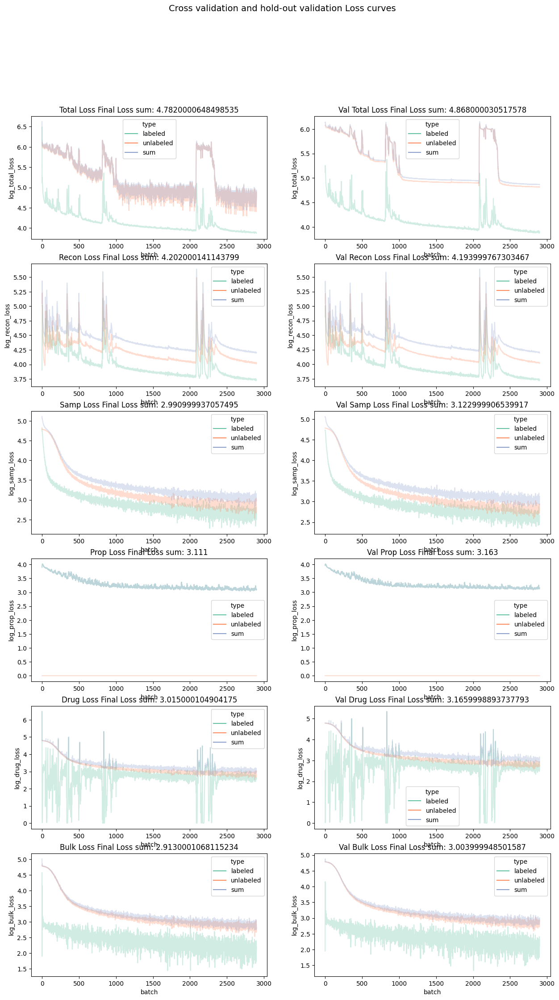

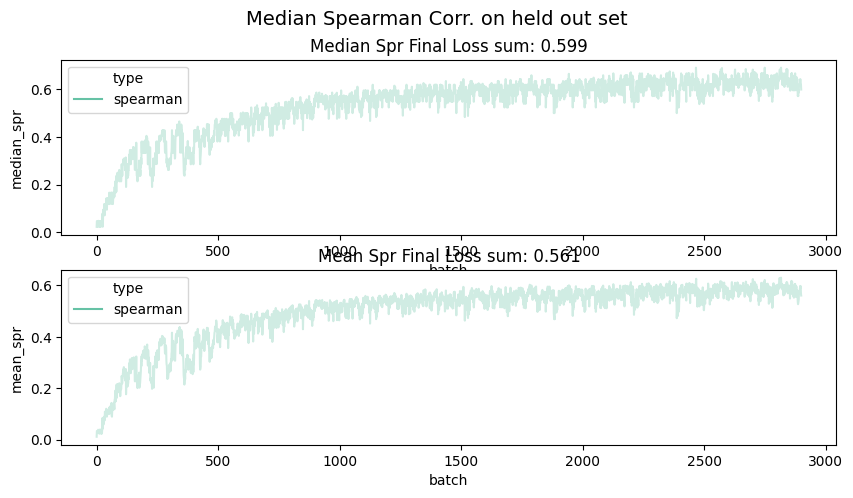

In [ ]:
curr_n_epoch=100
curr_wt = 100
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 100 1000

2024-03-19 16:34:21.413403: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_slack_4/bias/Assign' id:19637 op device:{requested: '', assigned: ''} def:{{{node encoder_slack_4/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_slack_4/bias, encoder_slack_4/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 16:34:21.883650: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_4/truediv/y' id:19980 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_4/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in th

test_size_samp: 500
train_size_samp: 14500


2024-03-19 16:34:24.799559: W tensorflow/c/c_api.cc:304] Operation '{name:'training_16/Adam/encoder_slack_4/bias/v/Assign' id:21842 op device:{requested: '', assigned: ''} def:{{{node training_16/Adam/encoder_slack_4/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_16/Adam/encoder_slack_4/bias/v, training_16/Adam/encoder_slack_4/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 16:34:27.190071: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_9/AddN' id:20776 op device:{requested: '', assigned: ''} def:{{{node loss_9/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_9/mul, loss_9/mul_1, loss_9/mul_2, loss_9/mul_3)}}' was changed by setting attribute after it was run by a session. This mutati

Elapsed:  1446.109465122223
Epoch:  99
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_classifier/assets


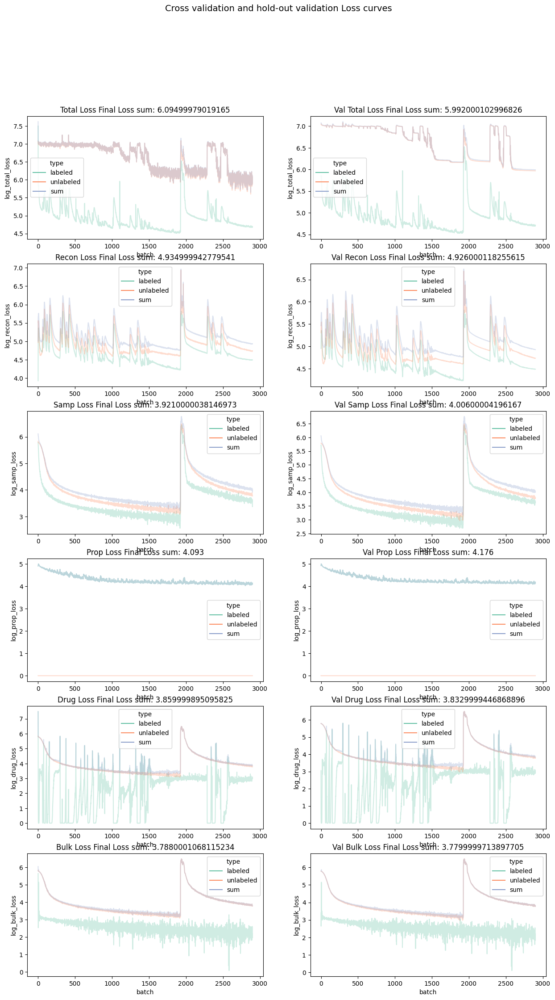

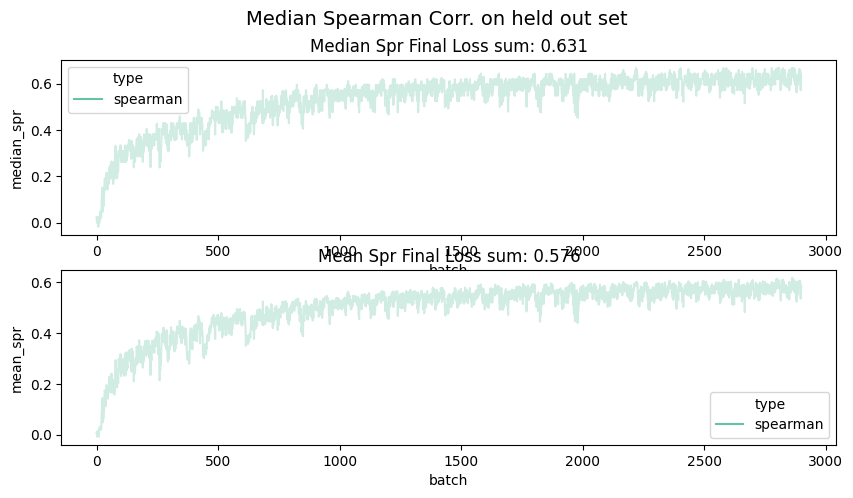

In [ ]:
curr_n_epoch=100
curr_wt = 1000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

fig.tight_layout()


### 100 10000

2024-03-19 16:58:41.660751: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_slack_5/kernel/Assign' id:24521 op device:{requested: '', assigned: ''} def:{{{node encoder_slack_5/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_slack_5/kernel, encoder_slack_5/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 16:58:42.207004: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_5/truediv/y' id:24869 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_5/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and 

test_size_samp: 500
train_size_samp: 14500


2024-03-19 16:58:45.585066: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_h1_15/bias/Assign' id:24974 op device:{requested: '', assigned: ''} def:{{{node decoder_h1_15/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](decoder_h1_15/bias, decoder_h1_15/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 16:58:48.554481: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_11/AddN' id:25665 op device:{requested: '', assigned: ''} def:{{{node loss_11/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_11/mul, loss_11/mul_1, loss_11/mul_2, loss_11/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't 

Elapsed:  1484.8230237960815
Epoch:  99
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_classifier/assets


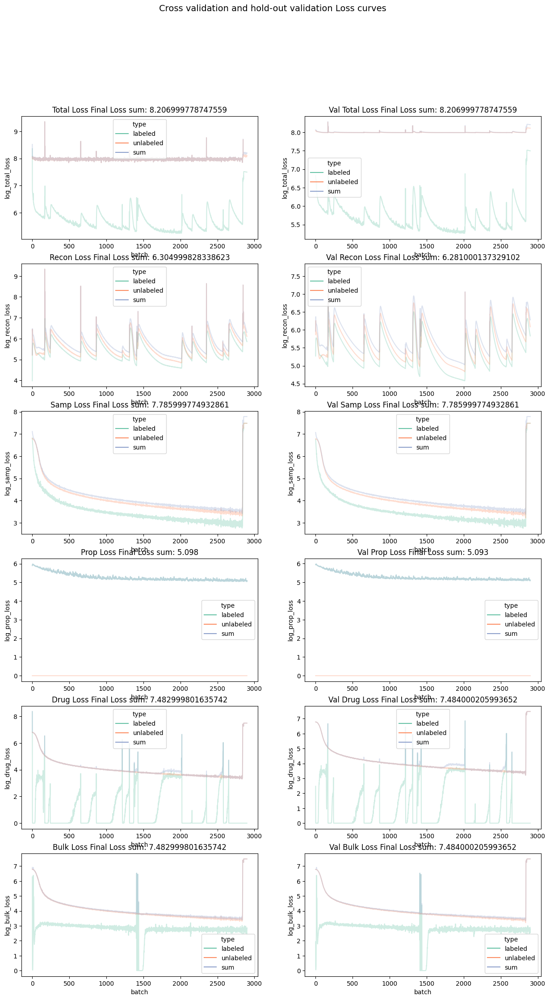

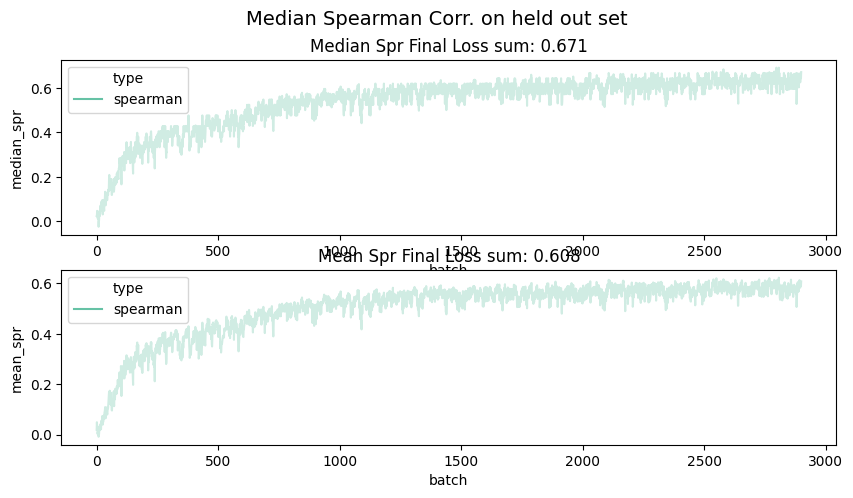

In [ ]:
curr_n_epoch=100
curr_wt = 10000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 200 100

2024-03-19 17:23:43.935006: W tensorflow/c/c_api.cc:304] Operation '{name:'mu_drug_6/bias/Assign' id:29603 op device:{requested: '', assigned: ''} def:{{{node mu_drug_6/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](mu_drug_6/bias, mu_drug_6/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 17:23:44.611191: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_6/truediv/y' id:29758 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_6/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't m

test_size_samp: 500
train_size_samp: 14500


2024-03-19 17:23:50.191463: W tensorflow/c/c_api.cc:304] Operation '{name:'training_24/Adam/encoder_drug_6/bias/m/Assign' id:31406 op device:{requested: '', assigned: ''} def:{{{node training_24/Adam/encoder_drug_6/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_24/Adam/encoder_drug_6/bias/m, training_24/Adam/encoder_drug_6/bias/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 17:23:54.180850: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_13/AddN' id:30554 op device:{requested: '', assigned: ''} def:{{{node loss_13/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_13/mul, loss_13/mul_1, loss_13/mul_2, loss_13/mul_3)}}' was changed by setting attribute after it was run by a session. This muta

Elapsed:  3013.5799741744995
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_100_rittoc-synovium_classifier/assets


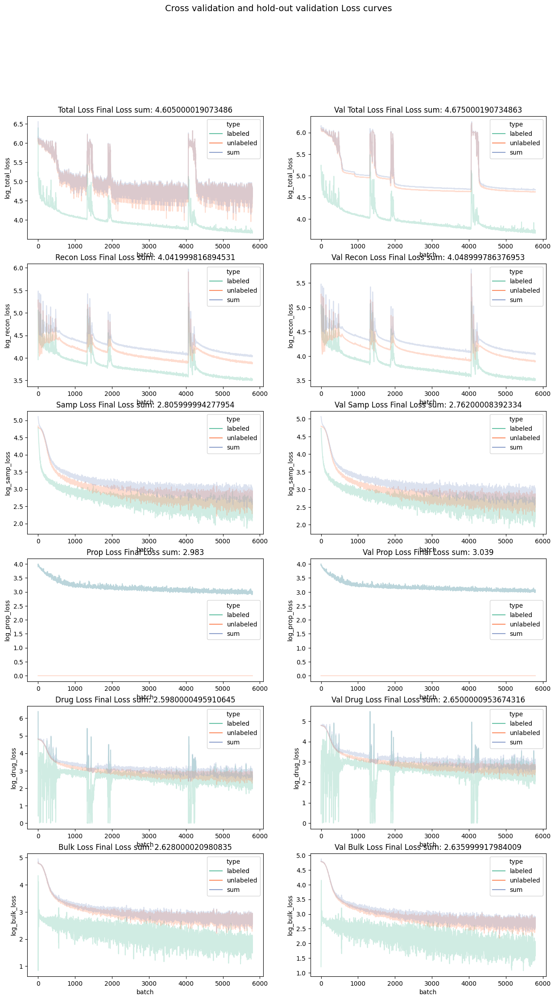

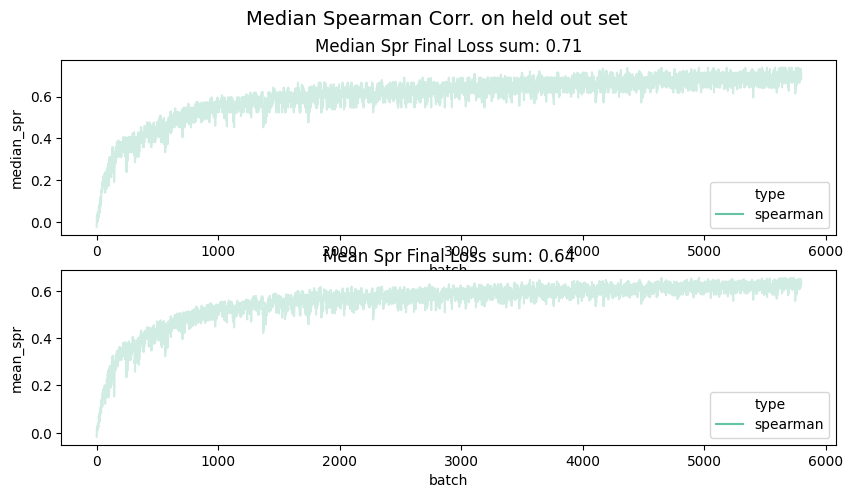

In [ ]:
curr_n_epoch=200
curr_wt = 100
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 200 1000

2024-03-19 18:14:16.155796: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_slack_7/bias/Assign' id:34304 op device:{requested: '', assigned: ''} def:{{{node encoder_slack_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_slack_7/bias, encoder_slack_7/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 18:14:16.895465: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_7/truediv/y' id:34647 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_7/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in th

test_size_samp: 500
train_size_samp: 14500


2024-03-19 18:14:23.572121: W tensorflow/c/c_api.cc:304] Operation '{name:'total_67/Assign' id:34931 op device:{requested: '', assigned: ''} def:{{{node total_67/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](total_67, total_67/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 18:14:27.794191: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_15/AddN' id:35443 op device:{requested: '', assigned: ''} def:{{{node loss_15/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_15/mul, loss_15/mul_1, loss_15/mul_2, loss_15/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or creat

Elapsed:  2910.3550951480865
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_classifier/assets


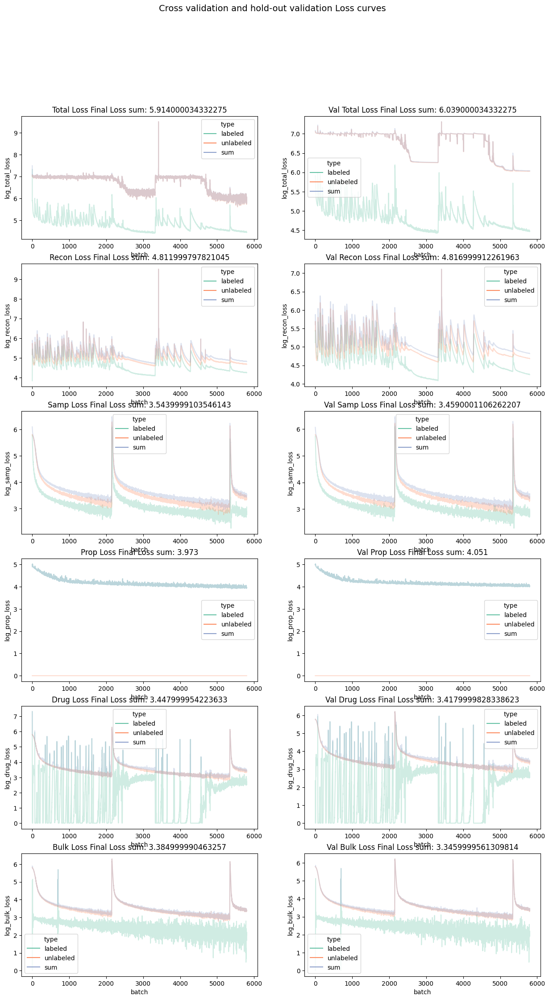

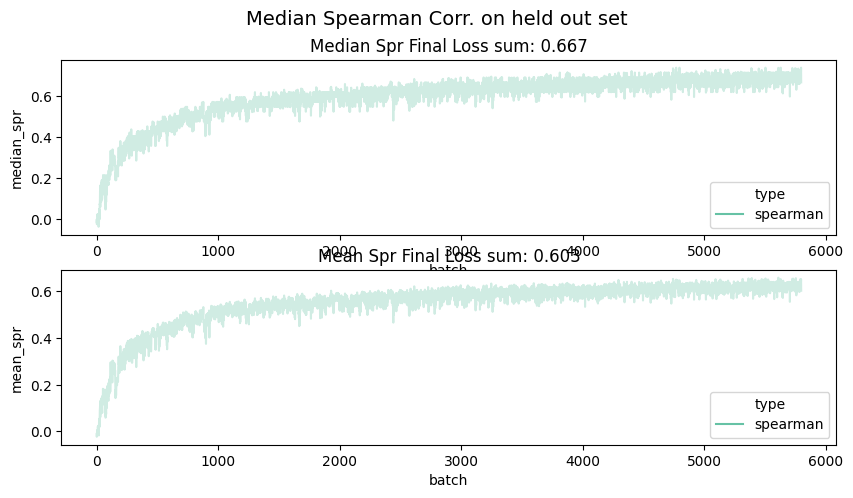

In [ ]:
curr_n_epoch=200
curr_wt = 1000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 200 10000

2024-03-19 19:03:06.354923: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_drug_8/kernel/Assign' id:39236 op device:{requested: '', assigned: ''} def:{{{node encoder_drug_8/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_drug_8/kernel, encoder_drug_8/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 19:03:07.142127: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_8/truediv/y' id:39536 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_8/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will

test_size_samp: 500
train_size_samp: 14500


2024-03-19 19:03:12.748900: W tensorflow/c/c_api.cc:304] Operation '{name:'training_32/Adam/sigma_drug_8/kernel/v/Assign' id:41465 op device:{requested: '', assigned: ''} def:{{{node training_32/Adam/sigma_drug_8/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_32/Adam/sigma_drug_8/kernel/v, training_32/Adam/sigma_drug_8/kernel/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 19:03:17.791223: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_17/AddN' id:40332 op device:{requested: '', assigned: ''} def:{{{node loss_17/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_17/mul, loss_17/mul_1, loss_17/mul_2, loss_17/mul_3)}}' was changed by setting attribute after it was run by a session. This muta

Elapsed:  2900.837380886078
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_classifier/assets


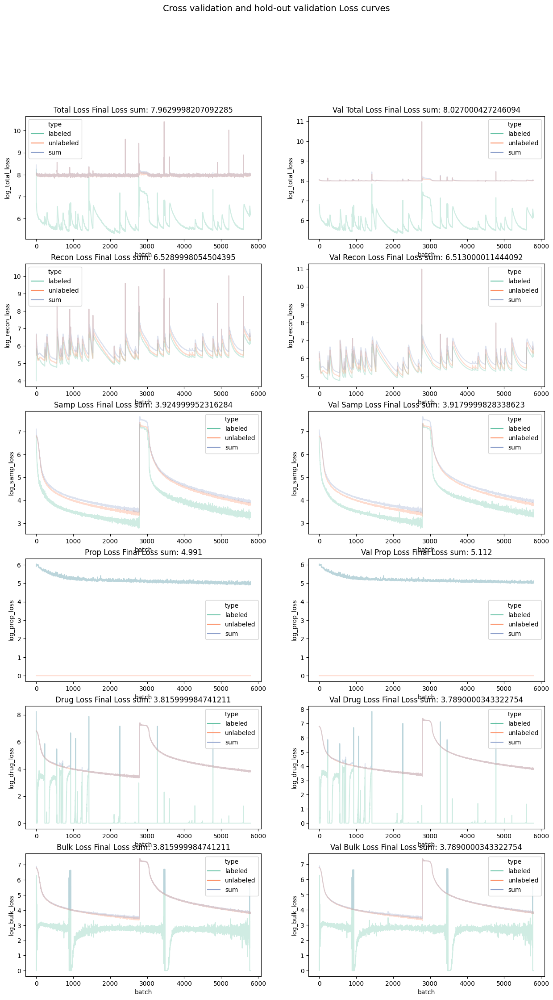

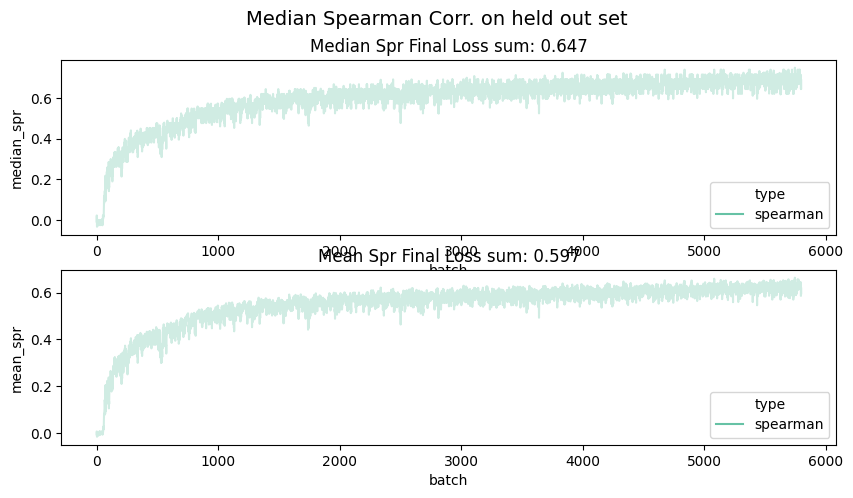

In [ ]:
curr_n_epoch=200
curr_wt = 10000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

In [ ]:
res

BuddiTrainResults(known_prop_vae=<keras.src.engine.functional.Functional object at 0x36571f0d0>, unknown_prop_vae=<keras.src.engine.functional.Functional object at 0x57d9c56f0>, encoder_unlab=<keras.src.engine.functional.Functional object at 0x28dec3e50>, encoder_lab=<keras.src.engine.functional.Functional object at 0x28dd98670>, decoder=<keras.src.engine.functional.Functional object at 0x28df6af50>, classifier=<keras.src.engine.functional.Functional object at 0x36571e260>, loss_fig=<Figure size 1500x2500 with 12 Axes>, spr_fig=<Figure size 1000x500 with 2 Axes>, output_folder='/Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium/')

# **Results**

Looking at all the results, we see that 200 epochs and weight of 100 gets the lowest reconstruction error and performs reasonably well in estimating the cell-type proportions.

**log10 reconstruction error:**

| Weight | 50 epochs | 100 epochs | 200 epochs |
| :---: | :---: | :---: | :---: |
| 100 | 4.8 | 4.19 | **4.04** |
| 1000 | 5.25 | 4.926 | 4.81 |
| 10000 | 5.35 | 6.28 | 6.51 |


**spearman error:**

| Weight | 50 epochs | 100 epochs | 200 epochs |
| :---: | :---: | :---: | :---: |
| 100 | 0.61 | 0.599 | **0.71** |
| 1000 | 0.571 | 0.631 | 0.667 |
| 10000 | 0.619 | 0.671 | 0.647 |


In [41]:
curr_n_epoch=200
curr_wt = 100

if RETRAIN_MODELS: # RETRAIN_MODELS


    params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
                alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
                alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

    ## model 1
    curr_res_id = f"rittoc_model1_{res_id}"
    res1 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

    ## model 2
    curr_res_id = f"rittoc_model2_{res_id}"
    res2 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

    ## model 3
    curr_res_id = f"rittoc_model3_{res_id}"
    res3 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
               n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
               X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
               X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


res1_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/rittoc_model1_{res_id}_encoder_unlab")
res1_enc_lab = tf.keras.models.load_model(f"{res_data_path}/rittoc_model1_{res_id}_encoder_lab")
res1_dec = tf.keras.models.load_model(f"{res_data_path}/rittoc_model1_{res_id}_decoder")
res1_classifier = tf.keras.models.load_model(f"{res_data_path}/rittoc_model1_{res_id}_classifier")


res2_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/rittoc_model2_{res_id}_encoder_unlab")
res2_enc_lab = tf.keras.models.load_model(f"{res_data_path}/rittoc_model2_{res_id}_encoder_lab")
res2_dec = tf.keras.models.load_model(f"{res_data_path}/rittoc_model2_{res_id}_decoder")
res2_classifier = tf.keras.models.load_model(f"{res_data_path}/rittoc_model2_{res_id}_classifier")


res3_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/rittoc_model3_{res_id}_encoder_unlab")
res3_enc_lab = tf.keras.models.load_model(f"{res_data_path}/rittoc_model3_{res_id}_encoder_lab")
res3_dec = tf.keras.models.load_model(f"{res_data_path}/rittoc_model3_{res_id}_decoder")
res3_classifier = tf.keras.models.load_model(f"{res_data_path}/rittoc_model3_{res_id}_classifier")

2024-04-10 10:53:49.117138: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:375] MLIR V1 optimization pass is not enabled
2024-04-10 10:53:49.177358: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_4' id:264 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_4}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_10, Identity_4)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-04-10 10:53:49.833652: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_30' id:651 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_30}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_23, Identity_30)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-04-10 10:53:50.122429: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_50' id:837 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_50}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_25, Identity_50)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-04-10 10:53:50.341763: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_54' id:922 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_54}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_27, Identity_54)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-04-10 10:53:51.229596: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_62' id:1193 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_62}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_39, Identity_62)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-04-10 10:53:51.960376: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_101' id:1606 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_101}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_48, Identity_101)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-04-10 10:53:52.317218: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_108' id:1766 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_108}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_54, Identity_108)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-04-10 10:53:52.626314: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_111' id:1849 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_111}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_55, Identity_111)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-04-10 10:53:53.347758: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_132' id:2146 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_132}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_64, Identity_132)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-04-10 10:53:54.145002: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_159' id:2535 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_159}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_77, Identity_159)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-04-10 10:53:54.643322: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_164' id:2691 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_164}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_82, Identity_164)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-04-10 10:53:55.063503: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_171' id:2782 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_171}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_85, Identity_171)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


## visualize latent spaces

### subset data

In [42]:
# subset the data to the training data
# to show our latent spaces are learning appropriately

idx_tmp_bulk = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
idx_tmp_bulk = np.random.choice(idx_tmp_bulk, 5000, replace=True)


idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type != "realistic"))[0]
idx_tmp = np.random.choice(idx_tmp, 5000, replace=True)
idx_tmp = np.concatenate((idx_tmp, idx_tmp_bulk))

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = Y_full.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]
perturb_temp = index_drug[perturb_temp]


bulk_temp =np.copy(Bulk_full)
bulk_temp = bulk_temp[idx_tmp]


### plot data

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-04-10 10:54:02.498474: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack/add/z_samp_slack/add' id:375 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack/add/z_samp_slack/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack/BiasAdd, tf_op_layer_z_samp_slack/mul/z_samp_slack/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-04-10 10:54:03.947204: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_out/Softmax' id:94

(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


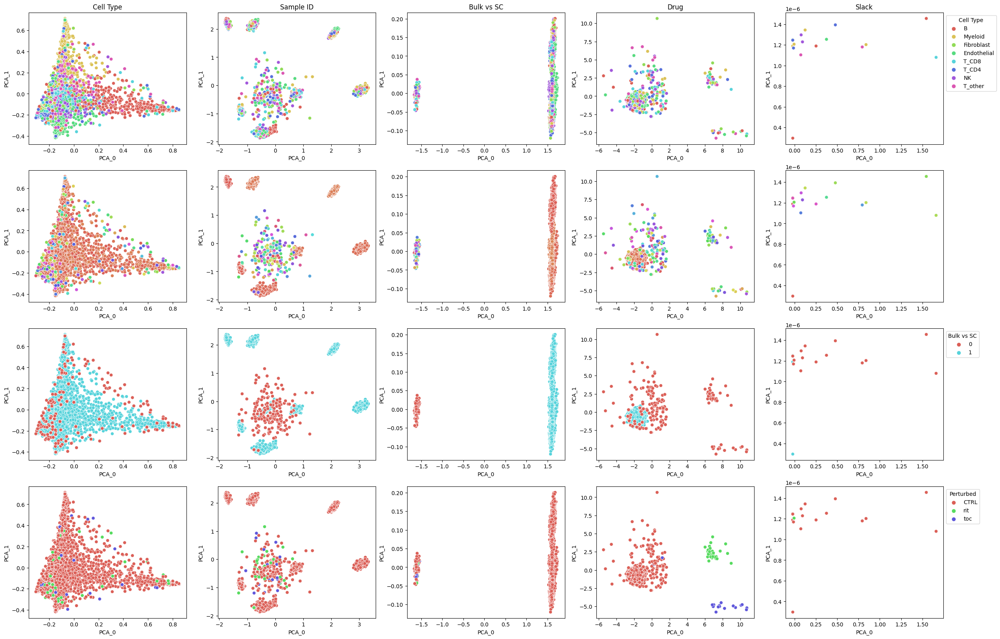

In [43]:

res1_latent_plot = buddi.plot_latent_spaces(res1_enc_unlab, res1_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True, use_pca=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-03-28 17:50:27.391498: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_1/add/z_samp_slack_1/add' id:11119 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_1/add/z_samp_slack_1/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_4/BiasAdd, tf_op_layer_z_samp_slack_1/mul/z_samp_slack_1/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-03-28 17:50:29.079000: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_out_3/Softmax' id:11687 op device:{requested: '', assigned: ''} def:{{{node cls_out_3/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](cls_out_3/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


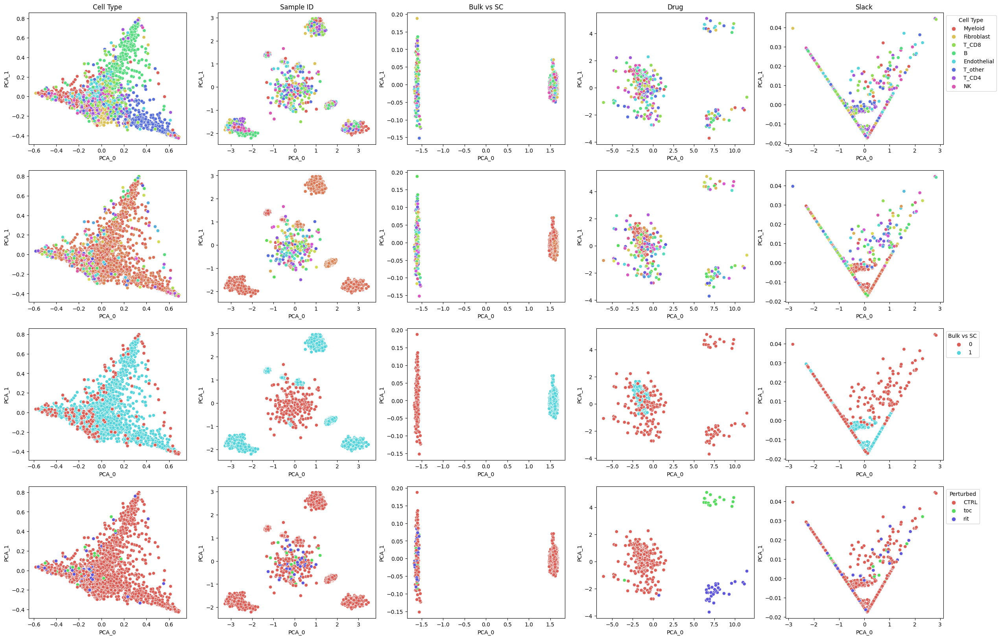

In [44]:

res2_latent_plot = buddi.plot_latent_spaces(res2_enc_unlab, res2_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-03-28 17:50:39.649085: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_1/add_2/z_samp_slack_1/add' id:12048 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_1/add_2/z_samp_slack_1/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_6/BiasAdd, tf_op_layer_z_samp_slack_1/mul_2/z_samp_slack_1/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-28 17:50:41.215242: W tensorflow/c/c_api.cc:304] Operation '{name:'

(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


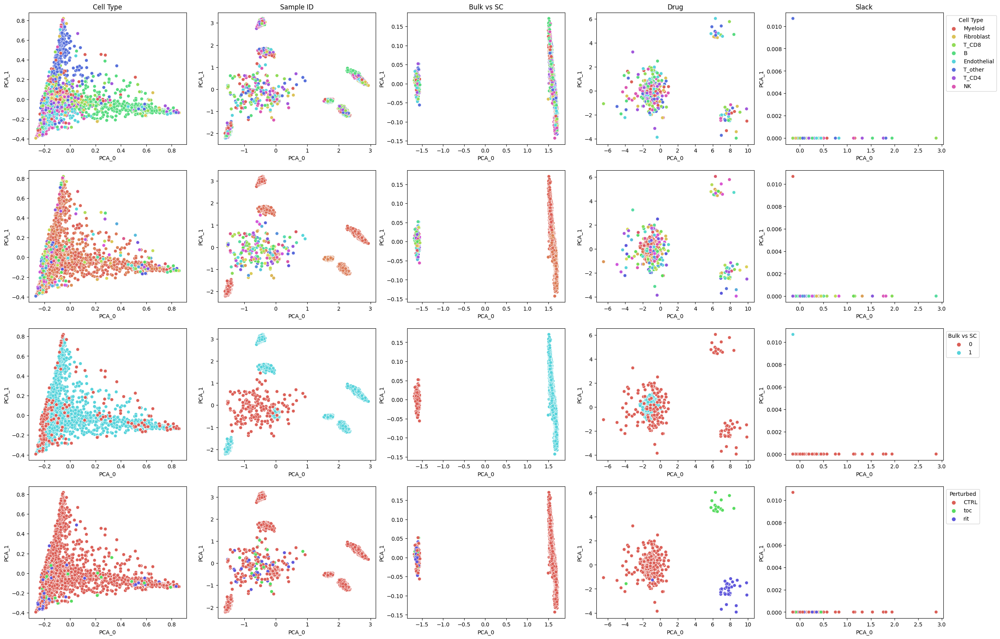

In [45]:

res3_latent_plot = buddi.plot_latent_spaces(res3_enc_unlab, res3_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True)

## visualize reconstruction

### subset data

In [46]:
# take all training data

recon_idx = np.where(np.logical_and(meta_df.cell_prop_type == "realistic", meta_df.isTraining == "Train"))[0]
recon_idx = np.where(recon_idx)[0]
recon_idx = np.random.choice(recon_idx, 1000, replace=True)

# subset our data

meta_temp = meta_df.iloc[recon_idx]

X_temp = np.copy(X_full[recon_idx])

Y_temp = np.copy(Y_full.iloc[recon_idx])
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_full.columns[Y_temp]


label_temp = np.copy(Label_full[recon_idx])
label_temp = index_label[label_temp]

perturb_temp = Drug_full[recon_idx]




### plot data

In [47]:
Y_full.iloc[recon_idx]

,NK,B,Endothelial,Fibroblast,Myeloid,T_CD8,T_CD4,T_other
0,0.010,0.285,0.050,0.050,0.110,0.065,0.295,0.135
0,0.010,0.100,0.165,0.005,0.010,0.015,0.685,0.010
0,0.005,0.275,0.010,0.040,0.610,0.020,0.035,0.005
0,0.065,0.015,0.085,0.225,0.185,0.250,0.140,0.035
0,0.105,0.115,0.190,0.060,0.090,0.030,0.320,0.090
...,...,...,...,...,...,...,...,...
0,0.310,0.070,0.005,0.020,0.015,0.030,0.010,0.540
0,0.005,0.065,0.050,0.730,0.030,0.025,0.040,0.055
0,0.290,0.590,0.035,0.010,0.040,0.025,0.005,0.005
0,0.645,0.040,0.005,0.205,0.005,0.040,0.010,0.050


/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-03-28 17:50:51.771134: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_6/Sigmoid' id:10664 op device:{requested: '', assigned: ''} def:{{{node decoder_out_6/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_6/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(2000, 2)
(2000, 2)


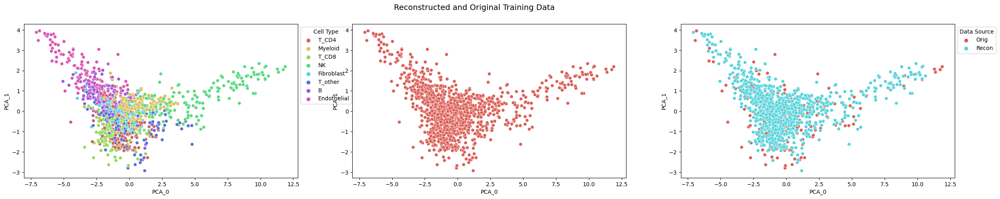

In [48]:
res1_recon_plot = buddi.plot_reconstruction_buddi(res1_enc_unlab, res1_classifier, res1_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-03-28 17:50:53.623013: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_7/Sigmoid' id:11593 op device:{requested: '', assigned: ''} def:{{{node decoder_out_7/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_7/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(2000, 2)
(2000, 2)


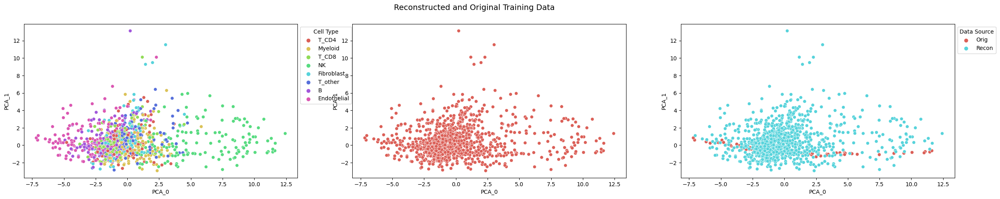

In [49]:
res2_recon_plot = buddi.plot_reconstruction_buddi(res2_enc_unlab, res2_classifier, res2_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-03-28 17:50:55.294018: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_8/Sigmoid' id:12522 op device:{requested: '', assigned: ''} def:{{{node decoder_out_8/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_8/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(2000, 2)
(2000, 2)


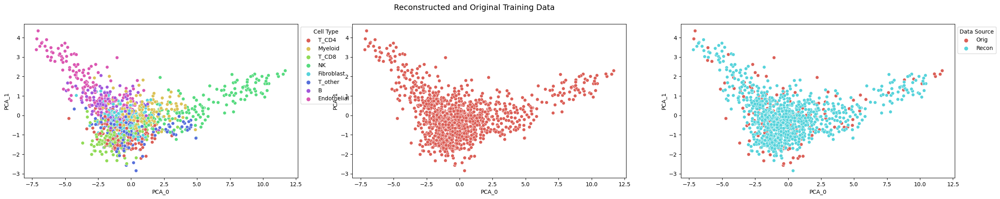

In [50]:
res3_recon_plot = buddi.plot_reconstruction_buddi(res3_enc_unlab, res3_classifier, res3_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)